### This Jupyter notebook creates the m2, river, watershed in subdomain files, for Neches River basin. This is done in a separate jupyter notebook since it takes a long time to run and we don't want to run it every time we run the main notebook.

### Most of the notebook was done by Saub. 

In [2]:
## Importing all the package needed to run the watershed workflow
# conda package imports ()
# Use the branch "master" (git checkout master)

import ipympl
%matplotlib ipympl

%load_ext autoreload
%autoreload 2

import os,sys
import numpy as np
import pandas
import geopandas as gpd
from matplotlib import pyplot as plt
import logging
import pandas as pd
import copy
import scipy
import shapely
import pickle
import datetime
import h5py

import watershed_workflow 
import watershed_workflow.source_list
import watershed_workflow.ui
import watershed_workflow.utils
import watershed_workflow.plot
import watershed_workflow.mesh
import watershed_workflow.regions
import watershed_workflow.densification
import watershed_workflow.condition
watershed_workflow.ui.setup_logging(1,None)
import plot_wrm # $ATS_SRC_DIR/tools/utils
import watershed_workflow.land_cover_properties

# # # ats_input_spec library, to be moved to amanzi_xml (install package from repo "python setup.py install")
# # add "path"/ats_input_spec to PYTHONPATH
# Set the path to the amanzi source directory
# import ats_input_spec as ais
# ais.set_amanzi_source('/Users/gpq/ORNL/Projects/SETx_Urban/ATS_Implementation/ATS_Base/repos/amanzi')
import ats_input_spec
import ats_input_spec.public
import ats_input_spec.io

# # # amanzi_xml, included in AMANZI_SRC_DIR/tools/amanzi_xml  
# install it using: python setup.py install
import amanzi_xml.utils.io as aio
import amanzi_xml.utils.search as asearch
import amanzi_xml.utils.errors as aerrors


from shapely.geometry import Polygon, LineString
from shapely.ops import split

In [3]:
# Set working directory on the script folder    
os.chdir('/Users/gpq/ORNL/Projects/ATS_runs/setx_campaigns/setx-neches/scripts')

In [4]:
# Parameters cell -- this provides all parameters that can be changed via pipelining to generate a new watershed.
name = 'neches' # name the domain, used in filenames, etc

# geometric parameters
simplify = 100 # length scale to target average edge
simplify_rivers = 100
stream_outlet_width = 500 # half-width to track a labeled set on which to get discharge
ignore_small_rivers = 2 # ignore rivers which have this or fewer reaches.  likely they are irrigation ditches
                        # or other small features which make things complicated but likely don't add much value
prune_by_area_fraction = 0.001 # ignore reaches whose accumulated catchment area is less than this fraction of the
                              # full domain's area
prune_by_area_fraction_waterbodies = 0.00005#0.001
num_smoothing_sweeps = 5 # number of times to smooth the DEM prior to elevating

# simulation control
start_year = 1980  # year to start and end simulation simulation -- note these start and end Oct 1 of the year
end_year = 2020
min_porosity = 0.05 # minimum porosity considered too small
max_permeability = 1.e-10 # max value allowed for permeability
max_vg_alpha = 1.e-3 # max value of van Genuchten's alpha -- our correlation is not valid for some soils

# triangle refinement control
include_rivers = True
refine_d0 = 100
refine_d1 = 500
refine_A0 = 8000
refine_A1 = 50000


# soil structure.
use_geologic_layer = True
SOILconfig = 2 # The subsurface layering is defined from SSURGO (top to bedrock), and SSD (set the depth to bedrock). Nodata values from SSURGO is filled with GLHYMPS. See workflow_viillage for more options

# logistics
generate_plots = True # plots take time to make and aren't always needed
generate_daymet = True # potentially don't do Met data forcing
generate_modis = True

include_heterogeneous = True
include_homogeneous = False # if true, also write files for homogeneous runs
include_homogeneous_wrm = False # if true, also write files for homogeneous WRMs
include_homogeneous_wrm_porosity = False # if true, also write files for homogeneous porosity and WRMs
include_homogeneous_wrm_permeability = False # if true, also write files for homogeneous perm and WRMs

log_to_file = False  # if true, write to file instead of in the notebook output
figsize = (6,6)
figsize_3d = (8,6)

In [5]:
# parameter checking
assert(simplify > 0 and simplify < 300)
assert(ignore_small_rivers == None or (ignore_small_rivers >= 0 and ignore_small_rivers <= 100))
assert(prune_by_area_fraction == None or (prune_by_area_fraction >= 0 and prune_by_area_fraction < 1))
assert(start_year >= 1980 and start_year < 2020)

if prune_by_area_fraction_waterbodies is None:
    prune_by_area_fraction_waterbodies = prune_by_area_fraction * 0.1

In [6]:
# a dictionary of outputs -- will include all filenames generated
outputs = {}

In [7]:
# Note that, by default, we tend to work in the DayMet CRS because this allows us to avoid
# reprojecting meteorological forcing datasets.
crs = watershed_workflow.crs.daymet_crs()

## Sources and setup

Next we set up the source watershed and coordinate system and all data sources for our mesh.  We will use the CRS that is included in the shapefile.

In [8]:
logging.info("")
logging.info("="*30)


2024-04-26 09:40:30,157 - root - INFO: 
2024-04-26 09:40:30,157 - root - INFO: ==============================


A wide range of data sources are available; here we use the defaults except for using NHD Plus for watershed boundaries and hydrography (the default is NHD, which is lower resolution and therefore smaller download sizes).

In [9]:
# set up a dictionary of source objects
sources = watershed_workflow.source_list.get_default_sources()
sources['hydrography'] = watershed_workflow.source_list.hydrography_sources['NHD Plus']
sources['HUC'] = watershed_workflow.source_list.huc_sources['NHD Plus']
sources['DEM'] = watershed_workflow.source_list.dem_sources['NED 1/3 arc-second']
watershed_workflow.source_list.log_sources(sources)

2024-04-26 09:40:30,173 - root - INFO: Using sources:
2024-04-26 09:40:30,173 - root - INFO: --------------
2024-04-26 09:40:30,173 - root - INFO: HUC: National Hydrography Dataset Plus High Resolution (NHDPlus HR)
2024-04-26 09:40:30,174 - root - INFO: hydrography: National Hydrography Dataset Plus High Resolution (NHDPlus HR)
2024-04-26 09:40:30,174 - root - INFO: DEM: National Elevation Dataset (NED)
2024-04-26 09:40:30,174 - root - INFO: soil structure: National Resources Conservation Service Soil Survey (NRCS Soils)
2024-04-26 09:40:30,174 - root - INFO: geologic structure: GLHYMPS version 2.0
2024-04-26 09:40:30,174 - root - INFO: land cover: National Land Cover Database (NLCD) Layer: NLCD_2019_Land_Cover_L48
2024-04-26 09:40:30,175 - root - INFO: lai: MODIS
2024-04-26 09:40:30,175 - root - INFO: soil thickness: None
2024-04-26 09:40:30,175 - root - INFO: meteorology: DayMet 1km


In [10]:
# # load the huc
# hucs_df_1202 = gpd.read_file('../data/nhd_mr_v2_huc1202.gpkg')
# hucs_df_1202 = hucs_df_1202.to_crs(crs)
# watershed_containing_basin_neches = hucs_df_1202.geometry[0]


# # load the huc
# hucs_df_1204 = gpd.read_file('../data/nhd_mr_v2_huc1204.gpkg')
# hucs_df_1204 = hucs_df_1204.to_crs(crs)
# watershed_containing_basin_gv= hucs_df_1204.geometry[0]

### Loading V2 Datasets and Defining Overall Domain

Composing the domian for Neches River Basin and Eastern Galvastan Bay

In [11]:
# full neches
# load hucs with judiciosu boundary selection
_, ws_full_neches = watershed_workflow.get_hucs(sources['HUC'], '1202', 4, crs)

_, ws_village = watershed_workflow.get_hucs(sources['HUC'], '12020006', 8, crs)

_, ws_pine_island_bayou = watershed_workflow.get_hucs(sources['HUC'], '12020007', 8, crs)

_, ws_ten_mile_creek_neches = watershed_workflow.get_hucs(sources['HUC'], '1202000304', 10, crs)

_, ws_east_galvastan_bay = watershed_workflow.get_hucs(sources['HUC'], '12040202', 8, crs)

_, ws_sabine_lake = watershed_workflow.get_hucs(sources['HUC'], '12040201', 8, crs)


_, ws_old_river= watershed_workflow.get_hucs(sources['HUC'], '120402010500', 12, crs)

_, ws_south_canal= watershed_workflow.get_hucs(sources['HUC'], '120402010400', 12, crs)


2024-04-26 09:40:30,206 - root - INFO: 
2024-04-26 09:40:30,206 - root - INFO: Loading level 4 HUCs in 1202
2024-04-26 09:40:30,206 - root - INFO: ------------------------------
2024-04-26 09:40:30,208 - root - INFO: Using HUC file "/Users/gpq/ORNL/Projects/ATS_runs/global_data/hydrography/NHDPlus_H_1202_GDB/NHDPlus_H_1202.gdb"
2024-04-26 09:40:30,255 - root - INFO: ... found 1 HUCs
2024-04-26 09:40:30,256 - root - INFO:   -- 1202
2024-04-26 09:40:30,256 - root - INFO: Converting to out_crs
2024-04-26 09:40:30,270 - root - INFO: Converting to shapely
2024-04-26 09:40:30,273 - root - INFO:  ... done


2024-04-26 09:40:30,275 - root - INFO: 
2024-04-26 09:40:30,275 - root - INFO: Loading level 8 HUCs in 12020006
2024-04-26 09:40:30,275 - root - INFO: ------------------------------
2024-04-26 09:40:30,276 - root - INFO: Using HUC file "/Users/gpq/ORNL/Projects/ATS_runs/global_data/hydrography/NHDPlus_H_1202_GDB/NHDPlus_H_1202.gdb"
2024-04-26 09:40:30,293 - root - INFO: ... found 1 HUCs
2024-04-26 09:40:30,293 - root - INFO:   -- 12020006
2024-04-26 09:40:30,294 - root - INFO: Converting to out_crs
2024-04-26 09:40:30,299 - root - INFO: Converting to shapely
2024-04-26 09:40:30,301 - root - INFO:  ... done
2024-04-26 09:40:30,302 - root - INFO: 
2024-04-26 09:40:30,303 - root - INFO: Loading level 8 HUCs in 12020007
2024-04-26 09:40:30,305 - root - INFO: ------------------------------
2024-04-26 09:40:30,307 - root - INFO: Using HUC file "/Users/gpq/ORNL/Projects/ATS_runs/global_data/hydrography/NHDPlus_H_1202_GDB/NHDPlus_H_1202.gdb"
2024-04-26 09:40:30,325 - root - INFO: ... found 1 H

In [12]:
# load the huc
ws_sabine_lake_cropped = [ws_sabine_lake[0].difference(shapely.ops.unary_union(ws_old_river+ws_south_canal))]
from shapely.ops import unary_union
my_hucs = [unary_union(ws_full_neches +ws_east_galvastan_bay+ws_sabine_lake_cropped)]

watershed_containing_basin = shapely.ops.unary_union(my_hucs)

In [13]:
# # save watershed_containing_basin as a shapefile, this is in shapely format
# gdf_basin = gpd.GeoDataFrame(geometry=[watershed_containing_basin], crs=crs) 
# gdf_basin.to_file('../data-processed/basin/complete_watershed_domain.shp')

In [14]:
version = '_v21'

In [15]:
def fixNames(df):
    df['HydrologicSequence'] = df.pop('hydroseq')
    df['DownstreamMainPathHydroSeq'] = df.pop('dnhydroseq')
    df['AreaSqKm'] = df.pop('areasqkm')
    df['TotalDrainageAreaSqKm'] = df.pop('totdasqkm')
    df['DivergenceRoutedDrainAreaSqKm'] = df.pop('divdasqkm')
    df['UpstreamMainPathHydroSeq'] = df.pop('uphydroseq')
    df['DivergenceCode'] = df.pop('divergence')


# find the corresponding reaches
def find_reaches(rivers, ids):
    reaches = []
    for nhdid in ids:
        found = False
        for river in rivers:
            n = river.getNode(nhdid)
            if n is not None:
                found = True
                reaches.append(n)
                break
        if not found:
            reaches.append(None)
    return reaches


In [16]:
# download/collect the river network within that shape's bounds
flowlines_df_1202 = gpd.read_file(f'../data/nhd_mr_v2_huc1202_flowlines{version}.gpkg')
flowlines_df_1202 = flowlines_df_1202.explode()
flowlines_df_1202 = flowlines_df_1202.to_crs(crs)

flowlines_df_1204 = gpd.read_file(f'../data/nhd_mr_v2_huc1204_flowlines{version}.gpkg')
flowlines_df_1204 = flowlines_df_1204.explode()
flowlines_df_1204 = flowlines_df_1204.to_crs(crs)

flowlines_df = flowlines_df_1202.append(flowlines_df_1204)

fixNames(flowlines_df)
flowlines_df['HydrologicSequence'] = flowlines_df['HydrologicSequence'].astype(int)
flowlines_df['DownstreamMainPathHydroSeq'] = flowlines_df['DownstreamMainPathHydroSeq'].astype(int)

In [17]:
cas_df_1202 = gpd.read_file(f'../data/nhd_mr_v2_huc1202_catchments{version}.gpkg')
cas_df_1204 = gpd.read_file(f'../data/nhd_mr_v2_huc1204_catchments{version}.gpkg')
cas_df = cas_df_1202.append(cas_df_1204)
cas_df = cas_df_1202.to_crs(crs)
cas_df['catchment'] = cas_df.pop('geometry')

In [18]:
# merge the two -- not all flowlines have cas?
flowlines_df = pd.merge(flowlines_df, cas_df, how='outer', left_on='comid', right_on='comid', suffixes=(None, '_ca'))
flowlines_df['ID'] = flowlines_df['comid']

In [19]:
# now convert to ww form
reaches_raw = [shapely.wkb.loads(shapely.wkb.dumps(geom, output_dimension=2)) for geom in flowlines_df.geometry]
flowlines_df_noflowlines = flowlines_df.drop(columns=['geometry',])
for i, fl in enumerate(reaches_raw):
    fl.properties = dict(flowlines_df_noflowlines.iloc[i])

print(len(reaches_raw))

9642


In [20]:
# and construct the rivers
reaches_raw = [reach for reach in reaches_raw if reach.intersects(watershed_containing_basin)]
rivers_raw = watershed_workflow.construct_rivers(reaches_raw, method='hydroseq')
print(len(rivers_raw))

2024-04-26 09:40:45,405 - root - INFO: 
2024-04-26 09:40:45,406 - root - INFO: Constructing river network
2024-04-26 09:40:45,406 - root - INFO: ------------------------------
2024-04-26 09:40:45,406 - root - INFO: Generating the river tree
2024-04-26 09:40:45,425 - root - INFO:  ... generated 7 rivers


7


In [21]:
def getNode(nhd_id , rivers):
    node = next(river.getNode(nhd_id) for river in rivers if river.getNode(nhd_id) != None)
    return node

def get_subDomain(id, subdomains):
    subdomain_index = next((index, subdomain) for index, subdomain in enumerate(subdomains) if subdomain.properties['outlet_ID'] == id)
    index, subdomain = subdomain_index
    return index, subdomain

## Subdomain generation

### Get river network

This will download the river network from the NHD Plus database, and simplify the network, constructing a tree-like data structure.

In [22]:
# # what about the reservoir!
# _, waterbodies_1202 = watershed_workflow.get_waterbodies(sources['hydrography'], '1202',  out_crs=crs, 
#                                                     prune_by_area=prune_by_area_fraction_waterbodies*watershed_containing_basin = shapely.ops.unary_union(my_hucs).exterior().area)

# _, waterbodies_1204 = watershed_workflow.get_waterbodies(sources['hydrography'], '1204', out_crs=crs,
#     prune_by_area=prune_by_area_fraction_waterbodies*watershed_containing_basin = shapely.ops.unary_union(my_hucs).exterior().area)

# waterbodies = waterbodies_1202 + waterbodies_1204

In [23]:
# now that we are done modifying, we must compute our own contributing areas on this new network
for river in rivers_raw:
    river.accumulate('AreaSqKm', to_save='ContributingAreaSqKm')

# reset the reaches raw, now that we are done manipulating
reaches_raw = [r for river in rivers_raw for r in river]

In [24]:
# make a copy of the rivers_raw and compute pruned rivers
rivers = [r.deepcopy() for r in rivers_raw]

rivers = watershed_workflow.reduce_rivers(rivers,
                                          ignore_small_rivers=ignore_small_rivers,
                                          prune_by_area=(50),
                                          area_property='ContributingAreaSqKm',
                                          remove_diversions=True,
                                          remove_braided_divergences=True)


for i, river in enumerate(rivers):
   print(i, len(river))

2024-04-26 09:40:47,633 - root - INFO: Removing rivers with fewer than 2 reaches.
2024-04-26 09:40:47,670 - root - INFO: ... removed 2 rivers
2024-04-26 09:40:47,671 - root - INFO: Removing rivers with area < 50
2024-04-26 09:40:47,671 - root - INFO: Removing divergent sections...
2024-04-26 09:40:48,200 - root - INFO:   ... removed 176 divergence tributaries with 307 total reaches.
2024-04-26 09:40:48,200 - root - INFO:   ... removed 3 divergence tributaries with 8 total reaches.
2024-04-26 09:40:48,211 - root - INFO:   ... removed 44 divergence tributaries with 84 total reaches.
2024-04-26 09:40:48,211 - root - INFO: Pruning by total contributing area < 50
2024-04-26 09:40:49,655 - root - INFO: ... pruned 4072
2024-04-26 09:40:49,656 - root - INFO: Removing rivers with fewer than 2 reaches.
2024-04-26 09:40:49,666 - root - INFO: ... removed 0 rivers


0 1457
1 21
2 262


In [25]:
## CUSTOM
## Both GV and main Neches tree are currently joined into main tree near the outlet, however they are connected through a canal that runs along the coast. 
## We separate them into two trees, both pouring out into the ocea at different locations

outlet_ids = ['1524219', '1115825']
# rivers_raw  = find_reaches(rivers_raw, outlet_ids)
rivers  = find_reaches(rivers, outlet_ids)



In [26]:
rivers_raw = list(sorted(rivers_raw, key=lambda a : -len(a)))
rivers = list(sorted(rivers, key=lambda a : -len(a)))


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


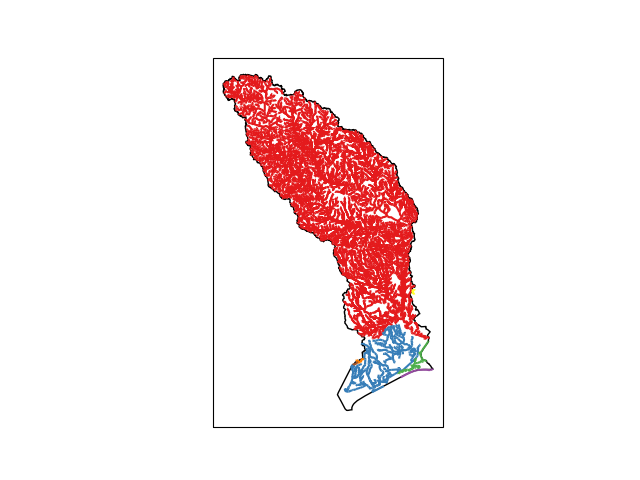

In [27]:
# what do these rivers look like?
fig, ax = watershed_workflow.plot.get_ax(crs)
watershed_workflow.plot.shplys([watershed_containing_basin,], crs, 'k', ax)

river_colors = watershed_workflow.colors.enumerated_colors(len(rivers_raw))
for i, river in enumerate(rivers_raw):
    watershed_workflow.plot.rivers([river,], crs, river_colors[i], ax)



In [28]:
watershed_containing_basin.area/1e6/6

4763.970823008724

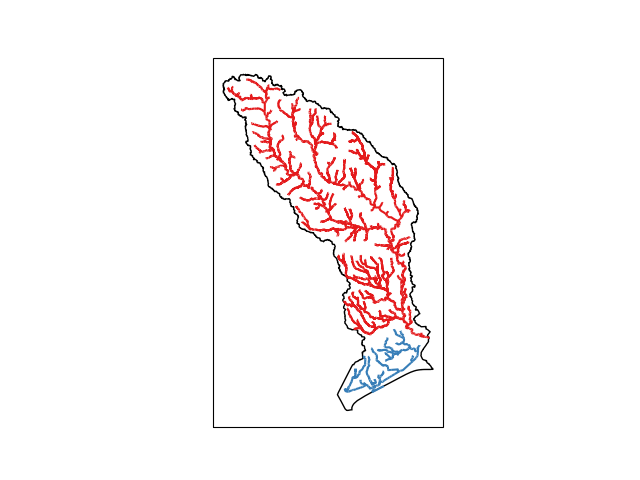

In [29]:
# and the simplified form
fig, ax = watershed_workflow.plot.get_ax(crs)
watershed_workflow.plot.shplys([watershed_containing_basin,], crs, 'k', ax)

river_colors = watershed_workflow.colors.enumerated_colors(len(rivers))
for i, river in enumerate(rivers):
    watershed_workflow.plot.rivers([river,], crs, river_colors[i], ax)


In [30]:
# shapefile_gages= '/Users/7s2/Research/projects/setx/SETx/data/gis/gagesII_9322_point_shapefile/gagesII_9322_sept30_2011.shp'
shapefile_gages= '/Users/gpq/ORNL/Databases/Gauges/gagesII_9322_point_shapefile/gagesII_9322_sept30_2011.shp'
gages = gpd.read_file(shapefile_gages)
gages = gages.to_crs(crs)
neches_gages = [point for point in gages.geometry if watershed_containing_basin.contains(point)]

for neches_gage in neches_gages: 
    gage = gages.loc[gages['geometry'].within(neches_gage)]

    gage_property_names = gages.columns.to_list()[:-1]
    gage_properties = gage.drop(['geometry'], axis=1)
    prop_dict = {name: value for name, value in zip(gage_property_names, gage_properties.values[0])}
    neches_gage.properties = prop_dict


2024-04-26 09:40:50,992 - fiona.ogrext - INFO: Failed to auto identify EPSG: 7


In [46]:
neches_gages[0].properties

{'STAID': '08031200',
 'STANAME': 'Kickapoo Ck nr Brownsboro, TX',
 'CLASS': 'Non-ref',
 'AGGECOREGI': 'SEPlains',
 'DRAIN_SQKM': 601.6167,
 'HUC02': '12',
 'LAT_GAGE': 32.309593,
 'LNG_GAGE': -95.605516,
 'STATE': 'TX',
 'HCDN_2009': None,
 'ACTIVE09': None,
 'FLYRS1900': 27.0,
 'FLYRS1950': 27.0,
 'FLYRS1990': 0.0}

In [48]:
# export neches_gages as a shapefile
gdf_gages = gpd.GeoDataFrame(geometry=neches_gages, crs=crs)
# add the atributes
gdf_gages['STAID'] = [gage.properties['STAID'] for gage in neches_gages]
gdf_gages['STANAME'] = [gage.properties['STANAME'] for gage in neches_gages]
gdf_gages['DRAIN_SQKM'] = [gage.properties['DRAIN_SQKM'] for gage in neches_gages]
gdf_gages['LAT_GAGE'] =  [gage.properties['LAT_GAGE'] for gage in neches_gages]
gdf_gages['LNG_GAGE'] = [gage.properties['LNG_GAGE'] for gage in neches_gages]

gdf_gages.to_file('../data-processed/neches_gages.shp')

/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


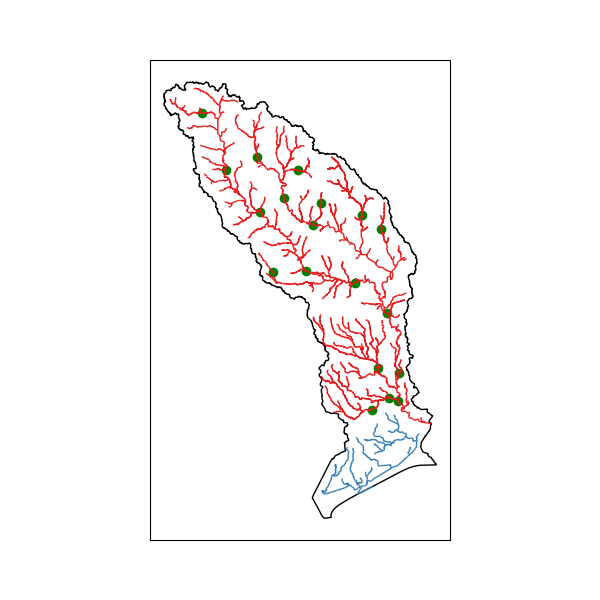

In [30]:
# and the simplified form
fig = plt.figure(figsize=figsize)
ax = watershed_workflow.plot.get_ax(crs, fig, window=[0.05,0.1,0.9,0.8])    
watershed_workflow.plot.shplys(my_hucs, crs, 'k', ax)
# watershed_workflow.plot.shplys(waterbodies, crs, 'g', ax, facecolor='c')
watershed_workflow.plot.shplys(neches_gages, crs, 'g', ax)

river_colors = watershed_workflow.colors.enumerated_colors(len(rivers_raw))
for i, river in enumerate(rivers):
    watershed_workflow.plot.rivers([river,], crs, river_colors[i], ax, linewidth= 1)



In [31]:
# the initial NHDPlusID of the full domain
gage_data = gpd.read_file(f'../data/neches_site_descriptions{version}.gpkg')
gage_data = gage_data.to_crs(crs)

gage_flowlines = pd.DataFrame({'comid':flowlines_df.comid,
                                   'flowline':flowlines_df.geometry})

gage_data = pd.merge(gage_data, gage_flowlines, how='left', left_on='comid', right_on='comid')

excluded_gages = ['Pine Island Bayou abv BI Pump Plant, Beaumont, TX', 'Bayou Lanana at Nacogdoches, TX','Neches Rv at Evadale, TX']
gages_selected = gage_data[~gage_data['name'].isin(excluded_gages)]
gages_selected

,identifier,navigation,measure,reachcode,name,source,sourceName,comid,type,uri,mainstem,geometry,flowline
0,USGS-08031200,https://labs.waterdata.usgs.gov/api/nldi/linke...,9.879423,12020001000135,"Kickapoo Ck nr Brownsboro, TX",nwissite,NWIS Surface Water Sites,4451722,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2603210,POINT (401440.820 -1074785.461),"LINESTRING Z (400933.044 -1074807.973 0.000, 4..."
1,USGS-08032000,https://labs.waterdata.usgs.gov/api/nldi/linke...,88.308180,12020001000112,"Neches Rv nr Neches, TX",nwissite,NWIS Surface Water Sites,4452936,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602412,POINT (419846.640 -1118787.001),"LINESTRING Z (419249.159 -1118498.733 0.000, 4..."
2,USGS-08032500,https://labs.waterdata.usgs.gov/api/nldi/linke...,94.895390,12020001023323,"Neches Rv nr Alto, TX",nwissite,NWIS Surface Water Sites,1077643,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602412,POINT (446104.569 -1151095.359),"LINESTRING Z (445943.005 -1151029.501 0.000, 4..."
3,USGS-08033000,https://labs.waterdata.usgs.gov/api/nldi/linke...,14.809472,12020002000020,"Neches Rv nr Diboll, TX",nwissite,NWIS Surface Water Sites,1079041,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602412,POINT (481919.680 -1197220.423),"LINESTRING Z (480833.649 -1196777.709 0.000, 4..."
4,USGS-08033300,https://labs.waterdata.usgs.gov/api/nldi/linke...,81.677606,12020002000166,"Piney Ck nr Groveton, TX",nwissite,NWIS Surface Water Sites,1080121,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2603096,POINT (456212.462 -1197968.011),"LINESTRING Z (455947.045 -1197238.510 0.000, 4..."
5,USGS-08033500,https://labs.waterdata.usgs.gov/api/nldi/linke...,68.708029,12020003000101,"Neches Rv nr Rockland, TX",nwissite,NWIS Surface Water Sites,1109655,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602412,POINT (520762.405 -1206392.933),"LINESTRING Z (520518.508 -1206295.075 0.000, 5..."
6,USGS-08033900,https://labs.waterdata.usgs.gov/api/nldi/linke...,94.710962,12020004000076,"E Fk Angelina Rv nr Cushing, TX",nwissite,NWIS Surface Water Sites,1149925,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2603389,POINT (475816.717 -1118991.329),"LINESTRING Z (475917.333 -1118950.060 0.000, 4..."
7,USGS-08034500,https://labs.waterdata.usgs.gov/api/nldi/linke...,32.869861,12020004000180,"Mud Ck nr Jacksonville, TX",nwissite,NWIS Surface Water Sites,1151409,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602992,POINT (444103.682 -1108335.159),"LINESTRING Z (443873.565 -1107491.400 0.000, 4..."
8,USGS-08036500,https://labs.waterdata.usgs.gov/api/nldi/linke...,25.782583,12020004000050,"Angelina Rv nr Alto, TX",nwissite,NWIS Surface Water Sites,1150499,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602713,POINT (465161.144 -1139984.373),"LINESTRING Z (463944.450 -1137806.249 0.000, 4..."
9,USGS-08037000,https://labs.waterdata.usgs.gov/api/nldi/linke...,6.487554,12020004000715,"Angelina Rv nr Lufkin, TX",nwissite,NWIS Surface Water Sites,1152351,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602713,POINT (487460.005 -1161777.749),"LINESTRING Z (486761.922 -1161012.718 0.000, 4..."


### Identify the major inlets/HUC12 spillpoints to the reservoir

In [32]:
# the initial NHDPlusID of the full domain
neches = rivers[0]
gv_bay = rivers[1]
outlet_ids = [neches.properties['ID'], gv_bay.properties['ID'] ]


# get the nhdids of the gage reaches
nhdids = list(gages_selected.comid) + outlet_ids
nhd_names = list(gages_selected.name)+['Neches River', 'GV Bay outlet']

for id, name in zip(nhdids, nhd_names):
    print(id, name)


4451722 Kickapoo Ck nr Brownsboro, TX
4452936 Neches Rv nr Neches, TX
1077643 Neches Rv nr Alto, TX
1079041 Neches Rv nr Diboll, TX
1080121 Piney Ck nr Groveton, TX
1109655 Neches Rv nr Rockland, TX
1149925 E Fk Angelina Rv nr Cushing, TX
1151409 Mud Ck nr Jacksonville, TX
1150499 Angelina Rv nr Alto, TX
1152351 Angelina Rv nr Lufkin, TX
1157813 Attoyac Bayou nr Chireno, TX
1159329 Ayish Bayou nr San Augustine, TX
1111453 Neches Rv nr Town Bluff, TX
1166409 Village Ck nr Kountze, TX
1143252 Pine Island Bayou nr Sour Lake, TX
1114345 Neches Rv Saltwater Barrier at Beaumont, TX
1115825 Neches River
1524219 GV Bay outlet


In [33]:
trunk_reaches = find_reaches(rivers_raw, nhdids)
assert(all(tr is not None for tr in trunk_reaches))

trunk_reaches_pruned = find_reaches(rivers, nhdids)
assert(all(tr is not None for tr in trunk_reaches))
print([i for (i,tr) in enumerate(trunk_reaches_pruned) if tr is None])


[]


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


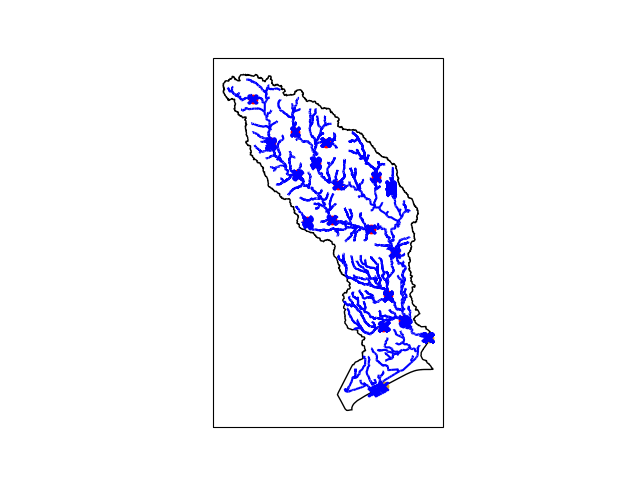

In [34]:
if generate_plots:
    fig, ax = watershed_workflow.plot.get_ax(crs)
    
    watershed_workflow.plot.shply(watershed_containing_basin , crs, 'k', ax)
    watershed_workflow.plot.rivers(rivers, crs,'b', ax)
    watershed_workflow.plot.shplys(gages_selected.geometry, crs, 'r', ax, label='gage locations')
    watershed_workflow.plot.shply(shapely.geometry.Point(neches.segment.coords[-1]), crs, 'goldenrod', ax)
    watershed_workflow.plot.shply(shapely.geometry.Point(gv_bay.segment.coords[-1]), crs, 'goldenrod', ax)

    gage_reaches = [tr.segment for tr in trunk_reaches_pruned]
    watershed_workflow.plot.shply(gage_reaches, crs, 'b', ax, marker='x')

### Partition the domain into nonoverlapping subdomains

In [35]:
# define domains that are the accumulated area of these trunk reaches
trunk_reaches, incremental_cas = watershed_workflow.river_tree.accumulateIncrementalCatchments(rivers_raw, nhdids, nhd_names)

# form a list of the rivers that are not used in trunk_reaches -- this will be used to fill the holes
rivers_not_touched = rivers_raw[:]
for tr_root in set([tr.getRoot() for tr in trunk_reaches]):
    rivers_not_touched.remove(tr_root)



In [36]:
# some contributing areas are discontinuous -- this is physically wrong, but what can you do?
incremental_cas2 = []
for poly in incremental_cas:
    if isinstance(poly, shapely.geometry.Polygon):
        incremental_cas2.append(poly)
    else:
        incremental_cas2.append(watershed_workflow.split_hucs.biggest(poly))
        incremental_cas2[-1].properties = poly.properties
incremental_cas = incremental_cas2


In [37]:
# sort the trunks by CA size -- this isn't needed but allows for nicer plots later
sorted_pairs = sorted(zip(trunk_reaches, incremental_cas), key=lambda a : a[0].properties['TotalDrainageAreaSqKm'], reverse=True)
trunk_reaches = [i[0] for i in sorted_pairs]
incremental_cas = [i[1] for i in sorted_pairs]

assert(all(hasattr(poly, 'properties') for poly in incremental_cas))
assert(all(isinstance(poly, shapely.geometry.Polygon) for poly in incremental_cas))



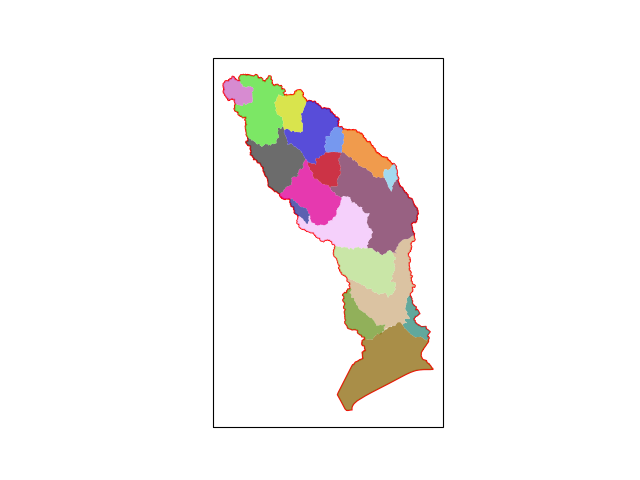

In [38]:
subdomains = watershed_workflow.utils.deepcopy(incremental_cas)


id, subdomain = get_subDomain('1524219', subdomains)
props = subdomain.properties
subdomain = shapely.ops.unary_union([subdomain]+ws_sabine_lake_cropped+ws_east_galvastan_bay)
subdomain.properties = props
subdomains[id] = subdomain


fig, ax = watershed_workflow.plot.get_ax(crs)
watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)

In [39]:
#### CUSTOM #### the small sliver hole was merge in domain far away when allowed to be merged automatically. We want to do it manually 

coastal_subdomain_exterior = shapely.geometry.Polygon(shapely.ops.unary_union([subdomains[0],subdomains[1], subdomains[17]]).exterior)
coastal_subdomains = shapely.ops.unary_union([subdomains[0], subdomains[1], subdomains[17]])

holes_in_between =  coastal_subdomain_exterior.difference(coastal_subdomains)
holes_sorted = list(sorted(holes_in_between, key=lambda p : p.area, reverse=True))
hole_of_concern = holes_sorted[2]

# merge it into GV suubdomain
props = subdomains[17].properties
subdomain_new = shapely.ops.unary_union([subdomains[17], hole_of_concern])
subdomain_new.properties = props

subdomains[17] = subdomain_new

2024-04-24 16:19:30,825 - root - INFO: Removing holes on 18 polygons
2024-04-24 16:19:30,826 - root - INFO:   -- removed interior
2024-04-24 16:19:30,864 - root - INFO:   -- union
2024-04-24 16:19:30,864 - root - INFO: Parsing 1 components for holes
2024-04-24 16:19:30,865 - root - INFO: Found a little hole: area = 16902.036006747978 at POINT (517935.0614000008 -1318142.9960888384)
2024-04-24 16:19:30,867 - root - INFO: Found a little hole: area = 41.360600031939704 at POINT (520641.1379467126 -1317940.2125813991)
2024-04-24 16:19:30,868 - root - INFO: Found a little hole: area = 0.6840415241926517 at POINT (521171.4270025867 -1318130.9096821018)
2024-04-24 16:19:30,870 - root - INFO: Found a little hole: area = 697.9428171135505 at POINT (521699.92896553606 -1318161.5915275435)
2024-04-24 16:19:30,871 - root - INFO: Found a little hole: area = 9337.702551242168 at POINT (522155.3370824584 -1318217.0111081724)
2024-04-24 16:19:30,872 - root - INFO: Found a little hole: area = 1078.5933

2


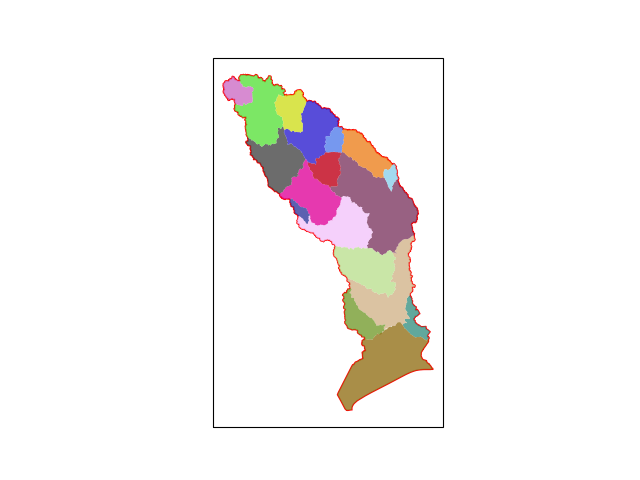

In [40]:
# automatically clean up holes on the interior or exterior boundary
subdomains, holes = watershed_workflow.split_hucs.removeHoles(subdomains)

print(len(holes))
fig, ax =  watershed_workflow.plot.get_ax(crs)
watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)


3167
1099
2
2


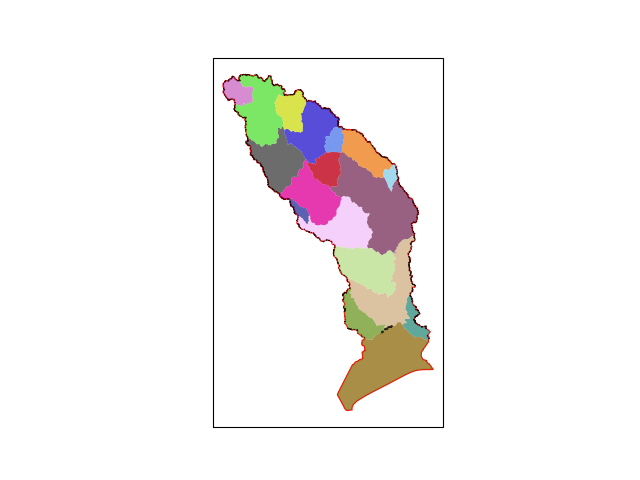

In [41]:
# get the missing areas
all_subdomains = shapely.ops.unary_union(subdomains)
missing_regions = watershed_containing_basin.difference(all_subdomains)
print(len(missing_regions))
missing_regions = [mr for mr in missing_regions if mr.area > 1000]
print(len(missing_regions))


fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)
watershed_workflow.plot.shplys(missing_regions, crs, 'k', ax, alpha=0.8)

# lots of small holes arounf the edge mostly due to using HR for overall watershed_containing_basin and V2 for subdomains
# let us now update watershed_containing_basin sicne it was built using NHDPlusHR. We are doing this 
watershed_containing_basin = shapely.geometry.Polygon(all_subdomains.exterior)


# get the missing areas
all_subdomains = shapely.ops.unary_union(subdomains)
missing_regions = watershed_containing_basin.difference(all_subdomains)
print(len(missing_regions))
missing_regions = [mr for mr in missing_regions if mr.area > 1000]
print(len(missing_regions))

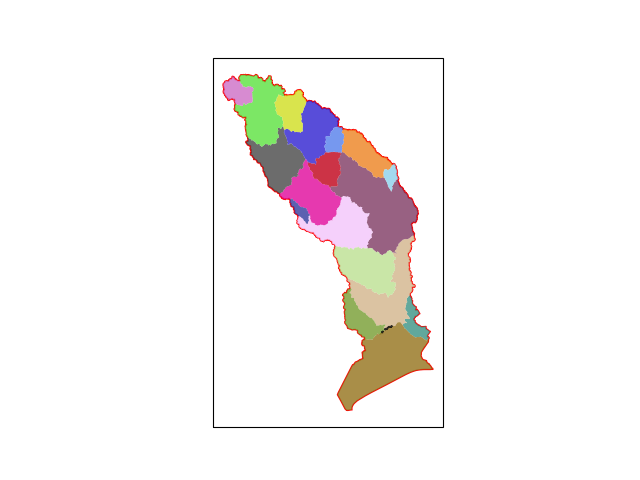

In [42]:
fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)
watershed_workflow.plot.shplys(missing_regions, crs, 'k', ax, alpha=0.8)

In [43]:
to_cleanup = []
for k,mr in enumerate(missing_regions):
    mr_buffer = mr.buffer(1.e-6)
    intersections = [i for (i,subdomain) in enumerate(subdomains) if mr_buffer.intersection(subdomain).area > 0]
    count = len(intersections)
    #print(k,count)
    if count == 1:
        my_i = intersections[0]
        props = subdomains[my_i].properties
        subdomains[my_i] = shapely.ops.unary_union([subdomains[my_i], mr_buffer])
        subdomains[my_i].properties = props
        #print(f'{k} is entirely contained in subdomain {my_i}')
    else:
        to_cleanup.append(mr)
        print(f'{k} is on {count} boundaries, {intersections}')

# note that the internal boundary and internal ones should already be done.  
# So should just be those with count == 1
#assert(len(to_cleanup) == 0)
assert(all(isinstance(poly, shapely.geometry.Polygon) for poly in subdomains))
assert(all(hasattr(poly, 'properties') for poly in subdomains))
print(len(to_cleanup))

0 is on 2 boundaries, [11, 17]
1 is on 2 boundaries, [1, 17]
2


Fixing the missing regions that touch two subdomains

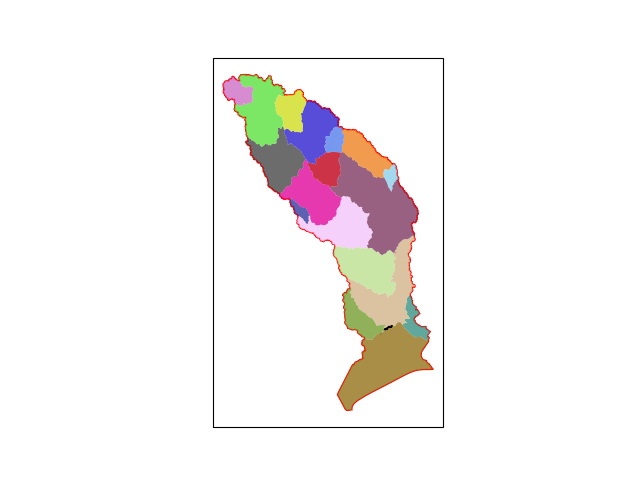

In [44]:
fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)
watershed_workflow.plot.shplys([to_cleanup[1]], crs, 'k', ax, facecolor='k', alpha=1)

In [45]:
# from visual inspection, the last missing region is to be merged into subdoomain
my_i = 11

props = subdomains[my_i].properties
subdomains[my_i] = shapely.ops.unary_union([subdomains[my_i], to_cleanup[0]])
subdomains[my_i].properties = props


my_i = 1
props = subdomains[my_i].properties
subdomains[my_i] = shapely.ops.unary_union([subdomains[my_i], to_cleanup[1]])
subdomains[my_i].properties = props

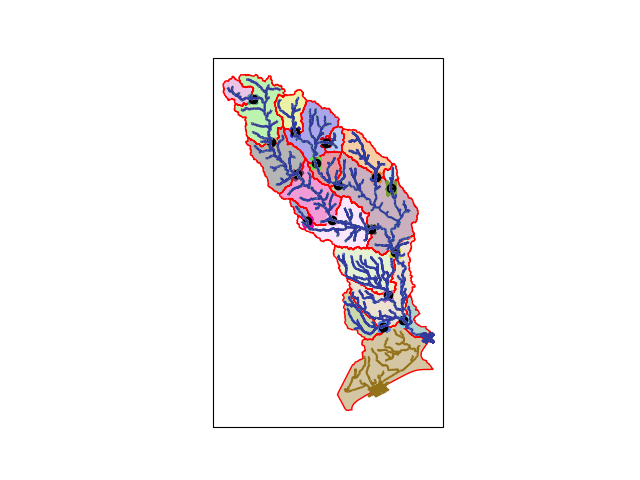

In [46]:
# ok, where are we at...

# set up a plotting function now that was have rivers, subdomains, gages
def plot(crs, subdomains, rivers, gages, color_by='river', mark_by='gage'):
    domain_colors = watershed_workflow.colors.enumerated_colors(len(subdomains), 1)
    fig, ax = watershed_workflow.plot.get_ax(crs)   

    if subdomains is not None:
        if isinstance(subdomains, list):
            subdomainPlotter = watershed_workflow.plot.shplys
        else:
            subdomainPlotter = watershed_workflow.plot.hucs
    
        subdomainPlotter(subdomains, crs, domain_colors, ax, facecolor='edge', alpha=0.4)
        subdomainPlotter(subdomains, crs, 'r', ax)

    if rivers is not None:
        if mark_by == 'all':
            markers = 'x'
        else:
            markers = None    
    
        if color_by == 'river' and len(rivers) == len(subdomains):
            for i,river in enumerate(rivers):
                watershed_workflow.plot.river(river, crs, domain_colors[i], ax, marker=markers)
                if mark_by == 'gage':
                    watershed_workflow.plot.shply(river.segment, crs, domain_colors[i], ax, marker='x')
        elif color_by == 'reach':
            watershed_workflow.plot.rivers(rivers, crs, None, ax, marker=markers)

    if gages is not None:
        watershed_workflow.plot.shplys(gages.geometry, crs, 'k', ax)
    return ax

ax = plot(crs, subdomains, trunk_reaches_pruned, gages_selected)
watershed_workflow.plot.shplys([to_cleanup[0]], crs, 'k', ax, facecolor='k', alpha=0.4)



In [47]:
subs_no_props = [shapely.geometry.Polygon(s) for s in subdomains]
watershed_workflow.io.write_to_shapefile('subdomains.shp', subs_no_props, crs)

reaches_no_props = [shapely.geometry.LineString(s) for s in rivers[0]]
watershed_workflow.io.write_to_shapefile('reaches.shp', reaches_no_props, crs)

In [48]:
# keep originals
rivers_orig = rivers_raw[:]
reaches_orig = [r for river in rivers_orig for r in river]
subdomains_orig = watershed_workflow.utils.deepcopy(subdomains)
watershed_orig = watershed_workflow.split_hucs.SplitHUCs(subdomains_orig)

2024-04-24 16:19:33,037 - root - INFO: Removing holes on 18 polygons
2024-04-24 16:19:33,038 - root - INFO:   -- removed interior
2024-04-24 16:19:33,074 - root - INFO:   -- union
2024-04-24 16:19:33,074 - root - INFO: Parsing 1 components for holes
2024-04-24 16:19:33,075 - root - INFO: Found a little hole: area = 1.6191626164840933e-10 at POINT (521747.73853393947 -1318179.0117151514)
2024-04-24 16:19:33,076 - root - INFO: Found a little hole: area = 8.333245204994455e-10 at POINT (522711.3005346236 -1318210.74528325)
2024-04-24 16:19:33,077 - root - INFO: Found a little hole: area = 5.444746875582496e-10 at POINT (523133.3999066294 -1316803.7211568565)
2024-04-24 16:19:33,078 - root - INFO: Found a little hole: area = 2.757325034963287e-09 at POINT (524545.6941648315 -1315377.3345078463)
2024-04-24 16:19:33,079 - root - INFO: Found a little hole: area = 6.590852308363537e-09 at POINT (529022.8526593578 -1312903.3189987089)
2024-04-24 16:19:33,080 - root - INFO: Found a little hole: 

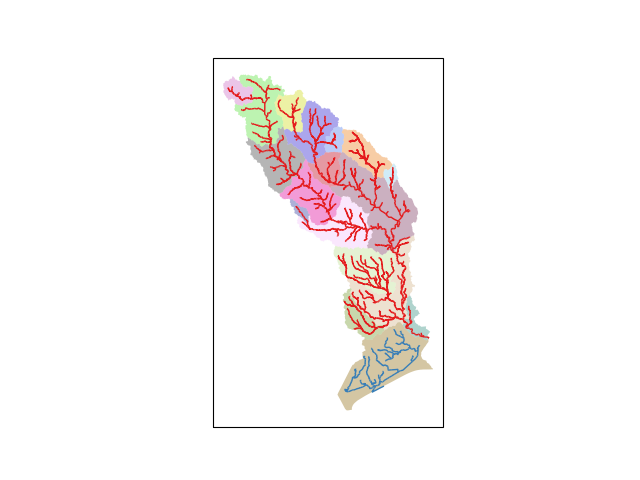

In [49]:
fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_colors = watershed_workflow.colors.enumerated_colors(len(watershed_orig.gons))
watershed_workflow.plot.hucs(watershed_orig, crs,watershed_colors, ax,facecolor='edge', alpha=0.4)

river_colors = watershed_workflow.colors.enumerated_colors(len(rivers))
for i, river in enumerate(rivers):
    watershed_workflow.plot.rivers([river,], crs, river_colors[i], ax, linewidth=1)


# BREAK -- Create Mesh

In [50]:
# make a copy to preserve originals for restart
subdomains_pristine = subdomains
subdomains = watershed_workflow.utils.deepcopy(subdomains_pristine)
watershed = watershed_workflow.split_hucs.SplitHUCs(subdomains)
rivers = [neches.deepcopy(),gv_bay.deepcopy()]
rivers_orig = [neches.deepcopy(),gv_bay.deepcopy()]
reaches = [r for r in rivers]

2024-04-24 16:19:33,848 - root - INFO: Removing holes on 18 polygons
2024-04-24 16:19:33,848 - root - INFO:   -- removed interior
2024-04-24 16:19:33,883 - root - INFO:   -- union
2024-04-24 16:19:33,884 - root - INFO: Parsing 1 components for holes
2024-04-24 16:19:33,884 - root - INFO: Found a little hole: area = 1.6191626164840933e-10 at POINT (521747.73853393947 -1318179.0117151514)
2024-04-24 16:19:33,886 - root - INFO: Found a little hole: area = 8.333245204994455e-10 at POINT (522711.3005346236 -1318210.74528325)
2024-04-24 16:19:33,887 - root - INFO: Found a little hole: area = 5.444746875582496e-10 at POINT (523133.3999066294 -1316803.7211568565)
2024-04-24 16:19:33,888 - root - INFO: Found a little hole: area = 2.757325034963287e-09 at POINT (524545.6941648315 -1315377.3345078463)
2024-04-24 16:19:33,888 - root - INFO: Found a little hole: area = 6.590852308363537e-09 at POINT (529022.8526593578 -1312903.3189987089)
2024-04-24 16:19:33,889 - root - INFO: Found a little hole: 

In [51]:
for river in rivers:
    assert river.is_continuous()
    assert river.is_consistent()
for river in rivers:
    for r in river:
        assert(r.length > 0)

In [52]:
# from here, rivers will be used to generate the corridor mesh
try:
    rivers = watershed_workflow.simplify(watershed, rivers, 
                                         simplify_hucs=200, simplify_rivers=160, 
                                         merge_tol=120, snap_tol=25, cut_intersections=True)
except watershed_workflow.utils.CutError as err:
    fig, ax = watershed_workflow.plot.get_ax(crs)   
    watershed_workflow.plot.shply(watershed_containing_basin, crs, 'k', ax, alpha=0.5)
    watershed_workflow.plot.hucs(watershed, crs, watershed_colors, ax, facecolor='edge', alpha=0.2)
    watershed_workflow.plot.river(rivers[0], crs, 'c', ax, alpha=0.4)

    watershed_workflow.plot.shply(err.line, crs, 'k', ax)
    watershed_workflow.plot.shply(err.seg, crs, 'r', ax, marker='x')
    watershed_workflow.plot.shply(err.cutline, crs, 'b', ax, marker='x')
    plt.show()
    raise err
else:
    # for plotting purpose only
    rivers_simplified = [r.deepcopy() for r in rivers]
    watershed_simplified = copy.deepcopy(watershed) 

    print('number of reaches in original', len([r for r in river for river in rivers_orig]), 'number of reaches in simplified', len([r for r in river for river in rivers]))

2024-04-24 16:19:35,429 - root - INFO: 
2024-04-24 16:19:35,429 - root - INFO: Simplifying
2024-04-24 16:19:35,430 - root - INFO: ------------------------------
2024-04-24 16:19:35,430 - root - INFO: Simplifying rivers
2024-04-24 16:19:35,582 - root - INFO:   ...cleaned inner segment of length 97.2152 at centroid (562378.4341543069, -1308364.0186811786) with id '1114389'
2024-04-24 16:19:35,688 - root - INFO:   ...cleaned inner segment of length 38.7112 at centroid (554104.3845399694, -1286563.7891806234) with id '1114285'
2024-04-24 16:19:35,712 - root - INFO:   ...cleaned inner segment of length 92.4653 at centroid (551539.0081511638, -1268421.9753403317) with id '1114183'
2024-04-24 16:19:35,732 - root - INFO:   ...cleaned inner segment of length 49.8684 at centroid (552239.6263159958, -1266958.991517532) with id '1114173'
2024-04-24 16:19:35,756 - root - INFO:   ...cleaned inner segment of length 77.2703 at centroid (553578.1333762248, -1262930.1214566482) with id '1114151'
2024-04

number of reaches in original 414 number of reaches in simplified 414


In [53]:
for river in rivers:
    assert river.is_continuous()
    assert river.is_consistent()
for river in rivers:
    for r in river:
        assert(r.length > 0)

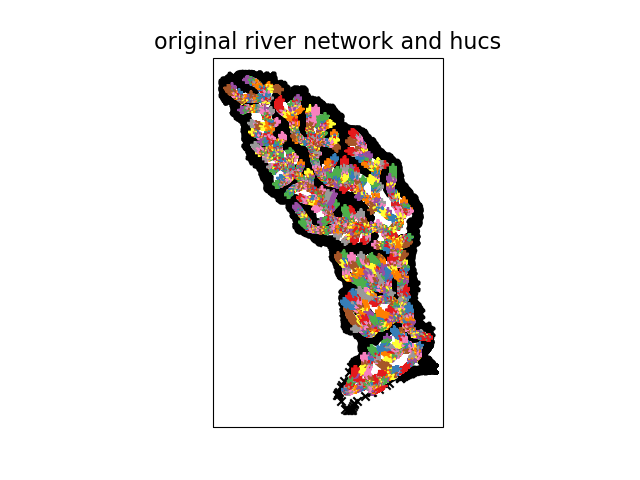

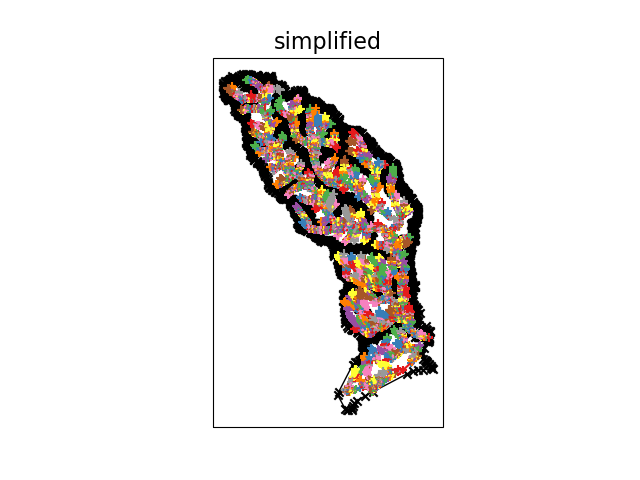

In [54]:


# plotting results
def plot(ws, rvrs, title):
    fig, ax = watershed_workflow.plot.get_ax(crs)
    watershed_workflow.plot.hucs(ws, crs, 'k', ax, marker='x')
    ax.set_title(title, fontsize=16)
    for rvr in rvrs:
        reach_colors = watershed_workflow.colors.enumerated_colors(len(rvr))
        watershed_workflow.plot.river(rvr, crs, reach_colors, ax, marker='+')
    return fig

# they appear in reverse order
fig2 = plot(watershed_simplified, rivers_simplified, 'simplified')
fig1 = plot(watershed_orig, rivers_orig, 'original river network and hucs')
plt.show()

In [55]:
#### CUSTOM ####
# fixing the outlet reach for the GV Bay outlet

seg = list(rivers[1].preOrder())[0].segment
seg_new = shapely.geometry.LineString(seg.coords[0:2])
list(rivers[1].preOrder())[0].segment = seg_new

rivers[0].parent = None


In [56]:
for river in rivers:
    assert river.is_continuous()
    assert river.is_consistent()
for river in rivers:
    for r in river:
        assert(r.length > 0)

In [57]:
# densify, adding back in points as needed
d0 = 50; d1 = 250
L0 = 200; L1 = 300

#densify_watershed
watershed_workflow.densification.densify_hucs(watershed, watershed_orig, rivers, limit_scales=[d0,L0,d1,L1]) 

#densify_river"
watershed_workflow.densification.densify_rivers(rivers, rivers_orig, limit=200)


2024-04-24 16:22:57,220 - root - INFO:   river min seg length: 51.38086890437417
2024-04-24 16:22:57,221 - root - INFO:   river median seg length: 146.70694496035154


In [58]:
#### CUSTOM ####
# fixing the outlet reach for the GV Bay outlet
rivers[1]=(watershed_workflow.hydrography.cut_and_snap_crossings(watershed, [rivers[1]], tol=150))[0]
seg = rivers[1].segment
outlet_point = seg.intersection(watershed.exterior().exterior)
seg_new = shapely.geometry.LineString([seg.coords[0], outlet_point.coords[0]])
list(rivers[1].preOrder())[0].segment = seg_new 


# fixing the huc boundary at GV outlet (extra point is removed)
id = 68
huc_seg = list(watershed.segments)[id]
huc_seg_coords = huc_seg.coords[:]
huc_seg_coords.pop(3)
watershed.segments[id]= shapely.geometry.LineString(huc_seg_coords)


# fixing the huc boundary with two intersections with a reach
id = 55
huc_seg = list(watershed.segments)[id]
huc_seg_new_coords = huc_seg.coords[:]
huc_seg_new_coords.pop(1) 
huc_seg_new = shapely.geometry.LineString(huc_seg_new_coords)
watershed.segments[id] = huc_seg_new 


# ## reaches too close to the huc boundary
# node = rivers[0].getNode('4452936')
# new_seg_coords = node.segment.coords[:]
# new_seg_coords[-2] = (0.5*(new_seg_coords[-1][0]+new_seg_coords[-3][0]), 0.5+0.5*(new_seg_coords[-1][1]+new_seg_coords[-3][1]))
# node.segment = shapely.geometry.LineString(new_seg_coords)

# node = rivers[0].getNode('1166409')
# new_seg_coords = node.segment.coords[:]
# new_seg_coords[26] = shapely.geometry.Polygon(new_seg_coords[25:28]).centroid.coords[0]
# node.segment = shapely.geometry.LineString(new_seg_coords)

2024-04-24 16:22:57,252 - root - INFO:   cutting at crossings
2024-04-24 16:22:57,253 - root - INFO: intersection found
2024-04-24 16:22:57,262 - root - INFO:   - cutting reach at external boundary of HUCs:
2024-04-24 16:22:57,263 - root - INFO:       split HUC boundary seg into 2 pieces
2024-04-24 16:22:57,263 - root - INFO:       split reach seg into 1 pieces


In [59]:

# treat sharp angles
watershed_workflow.densification.remove_sharp_angles(rivers, watershed, angle_limit=30, junction_angle_limit=20, huc_seg_river_angle_limit=25, limit=200)


2024-04-24 16:22:59,931 - root - INFO: removing sharp angle: 27.33516056500746
2024-04-24 16:23:00,993 - root - INFO: removing sharp angle: 24.00829621284228
2024-04-24 16:23:04,475 - root - INFO: removing sharp angle: 26.832098977318097
2024-04-24 16:23:06,240 - root - INFO: removing sharp angle: 29.174547259191456
2024-04-24 16:23:07,113 - root - INFO: removing sharp angle: 26.031688785851806
2024-04-24 16:23:07,527 - root - INFO: removing sharp angle: 25.811695305092197
2024-04-24 16:23:08,418 - root - INFO: removing sharp angle: 336.9771176290887
2024-04-24 16:23:09,569 - root - INFO: removing sharp angle: 339.384380560238
2024-04-24 16:23:09,571 - root - INFO: removing sharp angle: 29.87090933325388
2024-04-24 16:23:09,578 - root - INFO: removing sharp angle: 29.87090933325388
2024-04-24 16:23:09,579 - root - INFO: removing sharp angle: 339.384380560238
2024-04-24 16:23:12,027 - root - INFO: removing sharp angle: 333.00918340419304
2024-04-24 16:23:13,027 - root - INFO: removing s

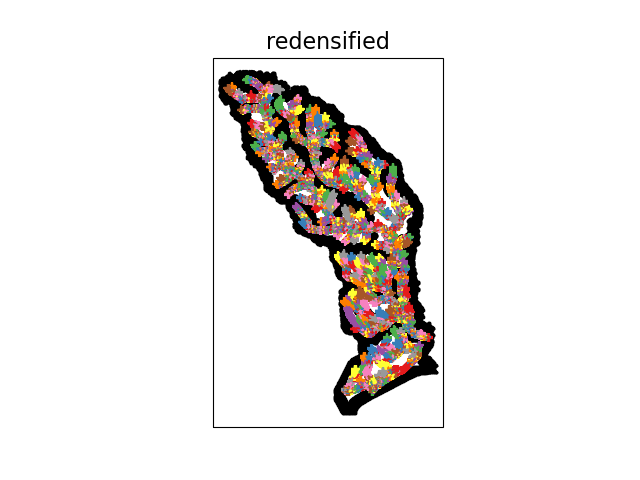

In [60]:
for river in rivers:
    assert river.is_continuous()
for river in rivers:
    for r in river:
        assert(r.length > 0)

# they appear in reverse order
fig3 = plot(watershed, rivers, 'redensified')
plt.show()

## BREAK -- watersheds and rivers are now set!

In [61]:
# how many types of Stream Orders are there
set([r.properties["streamorde"] for river in rivers  for r in river.preOrder()])

{-9, 1, 2, 3, 4, 5, 6}

In [62]:
for river in rivers:
    for node in river.preOrder():
        if node.properties["streamorde"]<0:
            node.properties["streamorde"]=5


In [63]:
orders = [r.properties["streamorde"] for river in rivers  for r in river.preOrder()]

2024-04-24 16:23:22,488 - root - INFO: 
2024-04-24 16:23:22,488 - root - INFO: Stream-aligned Meshing
2024-04-24 16:23:22,488 - root - INFO: ------------------------------
2024-04-24 16:23:22,489 - root - INFO: Creating stream-aligned mesh...
2024-04-24 16:23:22,489 - root - INFO:   ... setting up debug figure
2024-04-24 16:23:22,519 - root - INFO: River 0
2024-04-24 16:23:22,519 - root - INFO: ... generating initial polygon through dilation (4 m)
2024-04-24 16:23:22,549 - root - INFO:   -- treating collinearity
2024-04-24 16:23:22,639 - root - INFO:   -- river min seg length: 51.38086890437417
2024-04-24 16:23:22,639 - root - INFO:   -- merging points closer than 35.38086890437417 m along the river corridor
2024-04-24 16:23:22,843 - root - INFO: ... defining river-mesh topology (quad elements)
2024-04-24 16:23:29,448 - root - INFO: ... setting width of quad elements
2024-04-24 16:23:29,625 - root - INFO: ... enforcing convexity
2024-04-24 16:23:30,595 - root - INFO: River 1
2024-04-24

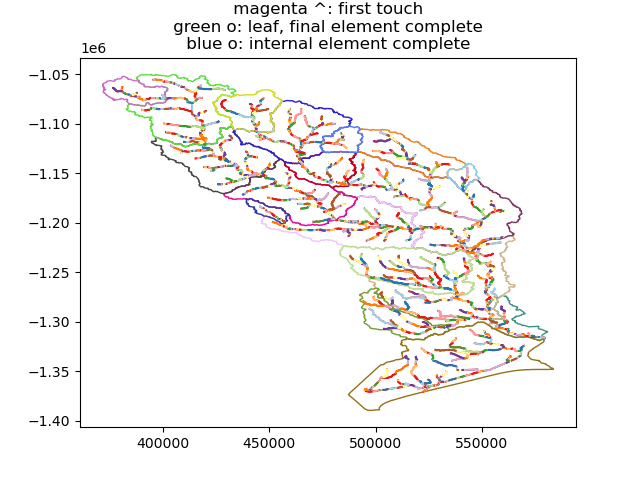

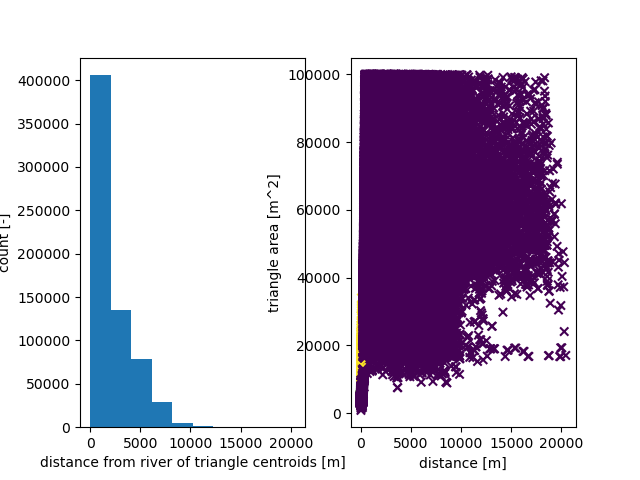

In [64]:
## Triangulation. This step takes around 40min !!!

refine_d0 = 150 
refine_d1 = 400
refine_A0 = 10000
refine_A1 = 100000


d0 = refine_d0; d1 = refine_d1
A0 = refine_A0; A1 = refine_A1 

# Refine triangles if they get too acute
min_angle = 20 # degrees

# width of reach by stream order (order:width)
widths = dict({2:10,3:20,4:30,5:30, 5:35, 6:45}) 

fig = plt.figure()
ax = fig.add_subplot(111)
watershed_workflow.plot.hucs(watershed, None, None, ax)
error =None
try:
    mesh_points2, conn_list, areas, dists = watershed_workflow.tessalate_river_aligned(watershed, rivers, river_width=widths,
                                              refine_min_angle=min_angle, 
                                              refine_distance=[d0,A0,d1,A1], 
                                              #refine_max_area=200000,
                                              diagnostics=True, ax=ax)
except watershed_workflow.river_mesh.IntersectionError as err:
    error = err
    # fig = plt.figure()
    # ax = fig.add_subplot(111)
    # watershed_workflow.plot.hucs(watershed, None, None, ax)
    watershed_workflow.plot.shply(err.huc_segment, None, 'k', ax, marker='x')
    watershed_workflow.plot.shply(err.river_seg, None, 'b', ax, marker='+')
    watershed_workflow.plot.shply(err.point, None, 'r', ax, marker='^')
    plt.show()
    raise err
except Exception as err:
    plt.show()
    raise err

In [65]:
# elems = [np.array(conn) for conn in conn_list if len(conn)==3]
# points = mesh_points2
# areas = np.array([watershed_workflow.utils.area(points[e]) for e in elems])
# print('maximum area of the triangle', round(max(areas),6) ,', minimum area of the triangle', round(min(areas),6), ', number of triangles', len(areas))

# # plot the resulting surface mesh
# fig = plt.figure(figsize=(10,10))
# ax = watershed_workflow.plot.get_ax(crs, fig)

# cbax = fig.add_axes([0.05,0.05,0.9,0.05])

# mp =ax.tripcolor(points[:,0], points[:,1], elems, areas, edgecolor='r')
# cbar = fig.colorbar(mp, orientation="horizontal", cax=cbax)
# ax.set_title('Triangulated Watershed with River-corridor as a Hole')
# #watershed_workflow.plot.hucs(watershed_modified, crs, ax=ax, color='k', linewidth=0.5)
# ax.set_aspect('equal', 'datalim')
# watershed_workflow.plot.hucs(watershed, None, 'c', ax)
# watershed_workflow.plot.rivers(rivers, None, 'b', ax)
# watershed_workflow.plot.shply(node.segment,None,'r', ax)

# # for point in tri_points:
# #     ax.plot(point[0], point[1], 'c-o', markersize=5)
# cbar.ax.set_title('triangle area [$m^2$]')

# plt.show()


In [66]:
dem_profile, dem = watershed_workflow.get_raster_on_shape(sources['DEM'], watershed.exterior(), crs)

# replacing NaNs to zero
dem[np.isnan(dem)] = 0

# elevate the triangle nodes to the dem
mesh_points3 = watershed_workflow.elevate(mesh_points2, crs, dem, dem_profile)


2024-04-24 17:01:35,978 - root - INFO: 
2024-04-24 17:01:35,979 - root - INFO: Loading Raster
2024-04-24 17:01:35,979 - root - INFO: ------------------------------
2024-04-24 17:01:35,983 - root - INFO: Collecting raster
2024-04-24 17:01:36,006 - root - INFO: Collecting DEMs to tile bounds: [-95.93569402794434, 29.340478755483883, -93.827693, 32.552455]
2024-04-24 17:01:36,007 - root - INFO:   Need:
2024-04-24 17:01:36,007 - root - INFO:     /Users/gpq/ORNL/Projects/ATS_runs/global_data/dem/USGS_NED_13as_n30_w096.tif
2024-04-24 17:01:36,007 - root - INFO:     /Users/gpq/ORNL/Projects/ATS_runs/global_data/dem/USGS_NED_13as_n30_w095.tif
2024-04-24 17:01:36,007 - root - INFO:     /Users/gpq/ORNL/Projects/ATS_runs/global_data/dem/USGS_NED_13as_n30_w094.tif
2024-04-24 17:01:36,007 - root - INFO:     /Users/gpq/ORNL/Projects/ATS_runs/global_data/dem/USGS_NED_13as_n31_w096.tif
2024-04-24 17:01:36,008 - root - INFO:     /Users/gpq/ORNL/Projects/ATS_runs/global_data/dem/USGS_NED_13as_n31_w095.t

In [67]:
# construct the 2D mesh
m2 = watershed_workflow.mesh.Mesh2D(mesh_points3.copy(), conn_list)

In [68]:
shapes = [shapely.geometry.Polygon(m2.coords[c, :]) for c in m2.conn]
area = np.array([shp.area for shp in shapes])
small = np.where(area < 500)[0]
centroids = m2.centroids


In [69]:
domain_colors = watershed_workflow.colors.enumerated_colors(len(subdomains), 1)

kwargs =  {'cmap': 'terrain', 'facecolor': 'none'}
setting face color =  [110.51894569002059, 121.24179342501668, 99.06057785596795, 104.61474874309408, 153.28128234597656, 112.03631669000923, 102.78455606340917, 106.18430548785561, 107.75324713828759, 115.19524931645606, 113.84674820859216, 100.75936719483575, 96.32791899115928, 108.29784124112217, 106.67707324242544, 109.72878250989727, 104.9757023164462, 75.68993421214385, 92.91876385826093, 103.12513594372679, 105.038648698006, 153.23666801848879, 138.1990270921314, 100.89975531097055, 110.67439642840434, 111.5048362661757, 95.60080119676176, 108.55914311149284, 108.0211552952408, 120.61937289330122, 108.93471834692899, 106.44095014625573, 106.67923350213032, 156.58119148739712, 116.12869626592517, 115.07208394018737, 142.55859294699133, 115.61798855920732, 106.05772276081875, 76.68819685015752, 107.78649374378563, 167.93538615990926, 153.5768172131822, 107.1320809301637, 83.22332080579582, 97.1300016008639, 198.16420111347153, 85.

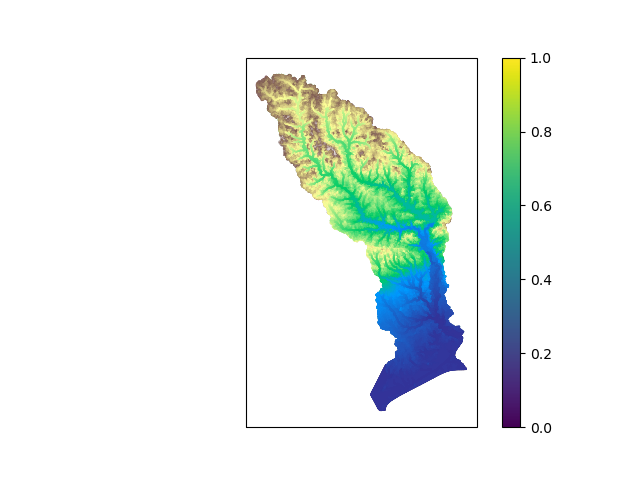

In [70]:
fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_workflow.plot.hucs(watershed, crs, domain_colors, ax, facecolor='edge', alpha=0.6)
watershed_workflow.plot.hucs(watershed, crs, domain_colors, ax)
im = watershed_workflow.plot.shplys(shapes, crs, 'elevation', ax, cmap='terrain')
sc = ax.scatter(centroids[small,0], centroids[small,1], c=area[small], marker='o', s=20)
plt.colorbar(sc)
plt.show()


### Conditioning 

In [71]:
# hydrologically condition the mesh, removing pits
river_mask=np.zeros((len(m2.conn)))
for i, elem in enumerate(m2.conn):
    if not len(elem)==3:
        river_mask[i]=1     
watershed_workflow.condition.fill_pits_dual(m2, is_waterbody=river_mask)

In [72]:
# conditioning river mesh

# adding elevations to the river tree for stream bed conditioning
watershed_workflow.condition.elevate_rivers(rivers, crs, dem, dem_profile)

# conditioning the river mesh using NHD elevations and burning in the river
for river in rivers:
    for reach in river.preOrder():
        # print(reach.properties)
        # order = reach.properties['StreamOrder']
        area = reach.properties['TotalDrainageAreaSqKm'] # [km2]
        # reduction = order * a + b
        if area <= 10:  
            reduction = 2 # [m] 
        elif area <= 100: 
            reduction = 3 # [m] 
        elif area <= 1000: 
            reduction = 4.5 # [m]
        else:
            reduction = 5   # [m]
        
        reach.properties['elev_profile'] = reach.properties['elev_profile'] - reduction

    # Depths in the mesh are calculated from the centroid of the mesh elements. This means that by depressing the quad element, the centroid of the neighboring triangles will be depressed as well.
    # This means that the bankfull capacity of the river is less than the expected. To account for this, the river is depressed 2 times the initial value

    # River depths is estimated based on https://pubs.usgs.gov/sir/2020/5086/sir20205086.pdf and StreamStats
    # The below equations are based on the regression equations in the above report https://pubs.usgs.gov/sir/2020/5086/sir20205086.pdf.
    # The equations estimate the following river depths as function of drainage area
    # 10km2 --> 1m depth
    # 100km2 --> 1.5m depth
    # 1000km2 --> 2.2m depth
    # 2000km2 --> 2.5m depth


In [73]:

# # conditioning the river mesh using NHD elevations
# watershed_workflow.condition.condition_river_meshes(m2, rivers,smooth=True, lower=True ,use_parent=True, network_burn_in_depth=0.5, depress_upstream_by=0.5)

for river in rivers:
    watershed_workflow.condition.condition_river_mesh(m2, river, lower=True, smooth=True)

In [74]:
# Change all the property name "streamorde" to "StreamOrder" in all the elements in rivers
for river in rivers:
    for reach in river.preOrder():
        reach.properties['StreamOrder'] = reach.properties['streamorde']
        del reach.properties['streamorde']


In [75]:
# add labeled sets for rivers based stream order. This is to easily set Manning values at each stream order.
watershed_workflow.regions.add_regions_by_stream_order_rivers(m2, rivers, labels=None)
#watershed_workflow.regions.add_regions_by_stream_order_rivers(m2, rivers, ['neches corridor', 'gv corridor'])

In [117]:
# Add labels for the outlets
outlet_points = [shapely.geometry.Point(getNode(poly.properties['outlet_ID'], rivers).segment.coords[-1]) for poly in watershed.polygons()]
watershed.polygon_outlets=outlet_points

In [123]:
# add labeled sets for subcatchments and outlets
watershed_workflow.regions.add_watershed_regions_and_outlets(m2, watershed, outlet_width=500, 
                                                             labels=[p.properties['name'] for p in watershed.polygons()]) # outlets=None,

In [124]:
for ls in m2.labeled_sets:
    print(f'{ls.setid} : {ls.entity} : {len(ls.ent_ids)} : "{ls.name}"')

10000 : CELL : 971 : "reaches of StreamOrder 6 in river 0 surface"
10001 : CELL : 2773 : "reaches of StreamOrder 4 in river 0 surface"
10002 : CELL : 5616 : "reaches of StreamOrder 3 in river 0 surface"
10003 : CELL : 4952 : "reaches of StreamOrder 2 in river 0 surface"
10004 : CELL : 823 : "reaches of StreamOrder 1 in river 0 surface"
10005 : CELL : 3354 : "reaches of StreamOrder 5 in river 0 surface"
10006 : CELL : 345 : "reaches of StreamOrder 5 in river 1 surface"
10007 : CELL : 951 : "reaches of StreamOrder 2 in river 1 surface"
10008 : CELL : 638 : "reaches of StreamOrder 1 in river 1 surface"
10009 : CELL : 385 : "reaches of StreamOrder 4 in river 1 surface"
10010 : CELL : 183 : "reaches of StreamOrder 3 in river 1 surface"
10011 : CELL : 12674 : "Neches River"
10012 : CELL : 12674 : "Neches River surface"
10013 : CELL : 66855 : "Neches Rv Saltwater Barrier at Beaumont, TX"
10014 : CELL : 66855 : "Neches Rv Saltwater Barrier at Beaumont, TX surface"
10015 : CELL : 97970 : "Neche

## Save the results to be used on mesh_m3_Neches.ipynb

In [134]:
# save the variables m2 and rivers for later use. This is to avoid re-running the above steps
name = 'neches'
outputs['m2_temp'] = f'../../../global_data/meshes/{name}_m2_temp.pkl'
outputs['rivers_temp'] = f'../../../global_data/meshes/{name}_rivers_temp.pkl'
outputs['watershed_temp'] = f'../../../global_data/meshes/{name}_watershed_temp.pkl'
outputs['subdomains_temp'] = f'../../../global_data/meshes/{name}_subdomains_temp.pkl'

# save data
with open(outputs['m2_temp'], 'wb') as f:
    pickle.dump(m2, f)
with open(outputs['rivers_temp'], 'wb') as f:
    pickle.dump(rivers, f)
with open(outputs['watershed_temp'], 'wb') as f:
    pickle.dump(watershed, f)
with open(outputs['subdomains_temp'], 'wb') as f:
    pickle.dump(subdomains, f)